# SMAI Assignment - 2

## Question 2: Gaussian Mixture Models

Resources:
- https://youtu.be/qMTuMa86NzU
- https://youtu.be/ZBLyXgjBx3Q

Reference: https://scikit-learn.org/stable/modules/mixture.html

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import cv2

from google.colab.patches import cv2_imshow

### Part 1: Gaussian Mixture Models

We'll attempt to solve the task of background subtraction using Gaussian Mixture Models. Before that, you will need to implement the Gaussian Mixture Model algorithm from scratch.

Some details:
- Try to implement GMMs using Multi-variate Gaussian Distributions, the following tasks in the assignment are possible to implement using the Univariate version too but it might be bit inaccurate as explained below.
    - To clarify further, we could treat each pixel in our RGB image as our data point with [R, G, B] channels as the dimensions to the Multi-variate data point, and we would easily get predictions for each pixel location using Multi-variate approach.
    - Or, we could treat every single value in the given RGB image as a data point independent of what channel the belong to and consider them as Uni-variate data point, and get prediction using the Uni-variate approach.
    But this affects our prediction, since we can't simply make per pixel predtions anymore, because for every pixel location we would now have 3 different predictions.
    - To get around this, you could convert your image to Grayscale and then we would only have one channel/value corresponding to each pixel location, which would now allow us to use the Uni-variate approach for prediction, but this also means loss in information which would affect our quality of predictions.
    - Try to have a class based implementation of GMM, this would really help you in Background Subtraction task. You can get some general ideas on how to structure your class by looking at `sklearn.mixture.GaussianMixture` documentation and source code.
- The following code cell has a rough template to get you started with the implementation. You are free to change the structure of the code, this is just a suggestion to help you get started.


TLDR: You may implement the univariate version of GMMs, but it might not be as accurate as the multivariate version and it is recommended to try and implement the multivariate version.

In [2]:
import numpy as np
from scipy.stats import multivariate_normal

class GMM(object):
    """
    Gaussian Mixture Model implementation.
    """

    def __init__(self, n_components=1, tol=1e-3, max_iter=100):
        """
        Initialize GMM parameters.

        Parameters:
        - n_components: Number of mixture components.
        - tol: Convergence threshold.
        - max_iter: Maximum number of iterations.
        """
        self.n_components = n_components
        self.tol = tol
        self.max_iter = max_iter
        self.weights = None
        self.means = None
        self.covars = None

    def initialize_params(self, X):
        """
        Initialize GMM parameters.

        Parameters:
        - X: Data matrix (NxD).
        """
        n_samples, n_features = X.shape
        np.random.seed(0)
        self.weights = np.ones(self.n_components) / self.n_components
        self.means = X[np.random.choice(n_samples, self.n_components, replace=False)]
        self.covars = np.tile(np.identity(n_features), (self.n_components, 1, 1))

    def E_step(self, X):
        """
        Perform the E-step.

        Parameters:
        - X: Data matrix (NxD).

        Returns:
        - responsibilities: Responsibility matrix (NxK).
        """
        log_likelihood = np.zeros((X.shape[0], self.n_components))
        for i in range(self.n_components):
            log_likelihood[:, i] = np.log(self.weights[i]) + multivariate_normal.logpdf(X, self.means[i], self.covars[i])
        log_likelihood -= log_likelihood.max(axis=1)[:, np.newaxis]
        likelihood = np.exp(log_likelihood)
        responsibilities = likelihood / likelihood.sum(axis=1)[:, np.newaxis]
        return responsibilities

    def M_step(self, X, responsibilities):
        """
        Perform the M-step.

        Parameters:
        - X: Data matrix (NxD).
        - responsibilities: Responsibility matrix (NxK).
        """
        Nk = responsibilities.sum(axis=0)
        self.weights = Nk / X.shape[0]
        self.means = np.dot(responsibilities.T, X) / Nk[:, np.newaxis]
        for k in range(self.n_components):
            diff = X - self.means[k]
            self.covars[k] = np.dot(responsibilities[:, k] * diff.T, diff) / Nk[k]

    def fit(self, X):
        """
        Fit the GMM to the data.

        Parameters:
        - X: Data matrix (NxD).
        """
        self.initialize_params(X)
        prev_log_likelihood = None
        for _ in range(self.max_iter):
            responsibilities = self.E_step(X)
            self.M_step(X, responsibilities)
            log_likelihood = np.sum(np.log(np.sum(responsibilities, axis=1)))
            if prev_log_likelihood is not None and np.abs(log_likelihood - prev_log_likelihood) < self.tol:
                break
            prev_log_likelihood = log_likelihood

    def predict(self, X):
        """
        Predict the labels for the data samples.

        Parameters:
        - X: Data matrix (NxD).

        Returns:
        - labels: Predicted labels.
        """
        log_likelihood = np.zeros((X.shape[0], self.n_components))
        for i in range(self.n_components):
            log_likelihood[:, i] = np.log(self.weights[i]) + multivariate_normal.logpdf(X, self.means[i], self.covars[i])
        return np.argmax(log_likelihood, axis=1)


### Part 2: Background Subtraction

![traffic](./videos/traffic.gif)

In this question, you are required to extract the background image from a given set of training frames, and use the extracted background to display foreground objects in the test frames by subtracting that background image and then thresholding it accordingly.

In this question, we are going to try different baselines to extract background from low resolution camera footage:

1. Frame Averaging:
    - Just take the average of every training frame, which gives us an approximate background image.
    
2. GMM Per Pixel:
    - We will maintain per pixel GMMs of 2 components, and then fit these GMMs considering every training from for its corresponding pixel.
    - And then use these GMMs to predict the pixel labels for every subsequent frame.
    - Most of the time, the Gaussian with the higher weight corresponds to the background.
    - We can implement this in a simpler way but with worse prediction results, you can extract a mean background image similar to the first baseline above.
    - To extract the Mean background image, we can assign values of the Means corresponding to the highest weighted Gaussian for each pixel.
    - This method is much simpler to implement but, this could give worse results.

#### Extracting Frames from videos

In [3]:
source_folder = 'videos'
video = 'traffic.gif'

source_path = f'./{source_folder}/{video}'

In [5]:
data_folder = 'frames1'

frames_path = f"./{data_folder}/{video.rsplit('.', 1)[0]}"

In [6]:
%%capture

!mkdir -p {frames_path} > /dev/null ;

In [7]:
%%capture

!ffmpeg -i {source_path} {frames_path}/'frame_%04d.png' > /dev/null ;

#### Loading Frames

In [8]:
import glob

frames = []

for file_path in sorted(glob.glob(f'{frames_path}/*.png', recursive = False)):
    img = cv2.imread(file_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img = np.asarray(img, dtype=np.float64)
    img /= 255.0

    frames.append(img)

frames = np.asarray(frames, dtype=np.float64)

In [9]:
print(frames)

[[[[0.03137255 0.07058824 0.03137255]
   [0.03137255 0.07058824 0.03137255]
   [0.03137255 0.07058824 0.03137255]
   ...
   [0.78431373 0.81960784 0.85882353]
   [0.68627451 0.73333333 0.77254902]
   [0.6        0.64313725 0.68235294]]

  [[0.03137255 0.07058824 0.03137255]
   [0.02352941 0.03529412 0.0627451 ]
   [0.03137255 0.07058824 0.03137255]
   ...
   [0.81960784 0.84313725 0.86666667]
   [0.74901961 0.78039216 0.79215686]
   [0.67843137 0.69803922 0.7372549 ]]

  [[0.03137255 0.07058824 0.03137255]
   [0.03137255 0.07058824 0.03137255]
   [0.03137255 0.07058824 0.03137255]
   ...
   [0.02352941 0.03529412 0.0627451 ]
   [0.02352941 0.03529412 0.0627451 ]
   [0.10588235 0.1254902  0.15686275]]

  ...

  [[0.22745098 0.26666667 0.28627451]
   [0.22745098 0.26666667 0.28627451]
   [0.25098039 0.29019608 0.31372549]
   ...
   [0.49019608 0.47058824 0.28627451]
   [0.4        0.38823529 0.29019608]
   [0.40392157 0.4        0.36470588]]

  [[0.22745098 0.26666667 0.28627451]
   [0.2

In [10]:
print(frames.shape)

(80, 120, 160, 3)


#### Splitting the data

In [11]:
from sklearn.model_selection import train_test_split

print(f'frame: {frames.shape}')

train_frames, test_frames = train_test_split(frames, train_size=0.6)

print(f'train_frames: {train_frames.shape}')
print(f'test_frames: {test_frames.shape}')

frame: (80, 120, 160, 3)
train_frames: (48, 120, 160, 3)
test_frames: (32, 120, 160, 3)


Note: You may use helper libraries like `imageio` for working with GIFs.

```python
import imageio

def make_gif(img_list, gif_path, fps=10):
    imageio.mimsave(gif_path, img_list, fps=fps)
    return
```

#### Frame Averaging

Extract Background Image from the training data and display it.

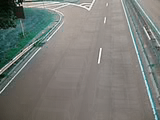

In [12]:


# Calculate the average frame
background_image = np.mean(train_frames, axis=0)

# Convert to uint8 (necessary for displaying with OpenCV)
background_image_uint8 = np.uint8(background_image * 255)

# Display the background image
cv2_imshow(background_image_uint8)


#### GMMs per pixel

Create Set of GMMs for every pixel and fit them considering every training frame

In [13]:
# Reshape the train frames to a 2D array where each row represents a pixel
train_frames_reshaped = train_frames.reshape(-1, train_frames.shape[-1])

# Number of components for GMM per pixel
n_components = 2  # You can adjust this as needed

# Create an empty list to store GMM models for each pixel
gmm_per_pixel = []

# Fit GMMs for each pixel
for i in range(train_frames_reshaped.shape[1]):  # Loop over pixels
    pixel_values = train_frames_reshaped[:, i]
    gmm = GMM(n_components=n_components)
    gmm.fit(pixel_values.reshape(-1, 1))  # Fit GMM for the current pixel
    gmm_per_pixel.append(gmm)

# Now gmm_per_pixel contains GMMs for every pixel


#### Extract Background Image from the trained model

In [ ]:
# # Initialize an empty array to store the background image
# background_image = np.zeros_like(train_frames[0])

# # Iterate over each pixel
# for i in range(train_frames.shape[1]):
#     for j in range(train_frames.shape[2]):
#         # Get the GMM model for the current pixel
#         gmm = gmm_per_pixel[i * train_frames.shape[2] + j]
#         # Extract the mean of the Gaussian component with the highest weight for the current pixel
#         background_mean = gmm.means[np.argmax(gmm.weights)]
#         # Assign the mean value as the background value for the current pixel
#         background_image[i, j] = background_mean

import numpy as np

# Initialize an empty array to store the background image
background_image = np.zeros_like(train_frames[0])

# Iterate over each pixel
for i in range(train_frames.shape[1]):
    for j in range(train_frames.shape[2]):
        # Calculate the index of the current pixel in the flattened array
        pixel_index = i * train_frames.shape[2] + j

        # Check if the pixel index is within the range of the gmm_per_pixel list
        if pixel_index < len(gmm_per_pixel):
            # Get the GMM model for the current pixel
            gmm = gmm_per_pixel[pixel_index]

            # Extract the mean of the Gaussian component with the highest weight for the current pixel
            background_mean = gmm.means[np.argmax(gmm.weights)]

            # Assign the mean value as the background value for the current pixel
            background_image[i, j] = background_mean
        else:
            # Handle the case where the pixel index exceeds the range of the gmm_per_pixel list
            print(f"Pixel index {pixel_index} out of range")




In [15]:
# Reshape the train frames to a 2D array where each row represents a pixel
train_frames_reshaped = train_frames.reshape(-1, train_frames.shape[-1])

# Number of pixels
num_pixels = train_frames_reshaped.shape[0]

# Number of components for GMM per pixel
n_components = 2  # You can adjust this as needed

# Create an empty list to store GMM models for each pixel
gmm_per_pixel = []

# Fit GMMs for each pixel
for i in range(num_pixels):  # Loop over pixels
    pixel_values = train_frames_reshaped[i]
    gmm = GMM(n_components=n_components)
    gmm.fit(pixel_values.reshape(-1, 1))  # Fit GMM for the current pixel
    gmm_per_pixel.append(gmm)

# Now gmm_per_pixel contains GMMs for every pixel

# Initialize an empty array to store the background image
background_image = np.zeros_like(train_frames[0])

# Iterate over each pixel
for i in range(train_frames.shape[1]):
    for j in range(train_frames.shape[2]):
        # Get the GMM model for the current pixel
        pixel_index = i * train_frames.shape[2] + j
        if pixel_index < num_pixels:  # Ensure index is within range
            gmm = gmm_per_pixel[pixel_index]
            # Extract the mean of the Gaussian component with the highest weight for the current pixel
            background_mean = gmm.means[np.argmax(gmm.weights)]
            # Assign the mean value as the background value for the current pixel
            background_image[i, j, :] = background_mean


### Outputs

You can use the helper functions given below to display and save frames as videos, feel free to change them accordingly.

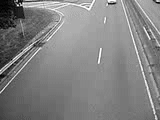

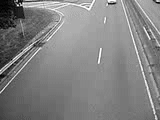

In [16]:
from google.colab.patches import cv2_imshow
import cv2
import os

# Helper functions
def display_frames(frames, fps=10.0):
    """
    Display the frames as a video.
    """
    eps = 0.0001

    wait_time = int(1000 // fps)

    for frame in frames:
        frame = frame.astype(np.float64)
        frame = (frame - frame.min()) * 255 / (frame.max() - frame.min() + eps)
        frame = frame.astype(np.uint8)

        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        cv2_imshow(frame)  # Use cv2_imshow instead of cv2.imshow
        k = cv2.waitKey(wait_time)

        if k == ord('q'):
            print("Quitting...")
            break

    cv2.destroyAllWindows()


def save_frames(frames, fps=10.0, output_path='./results', file_name='temp'):
    """
    Save the frames as a video.
    """
    eps = 0.0001

    frame_rate = float(fps)
    frame_size = (int(frames[0].shape[1]), int(frames[0].shape[0]))
    wait_time = int(1000 // fps)

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')

    save_path = os.path.join(output_path, f"{file_name.rsplit('.', 1)[0]}.mp4")

    vid_wrt = cv2.VideoWriter(save_path, fourcc, frame_rate, frame_size)

    for frame in frames:
        frame = frame.astype(np.float64)
        frame = (frame - frame.min()) * 255 / (frame.max() - frame.min() + eps)
        frame = frame.astype(np.uint8)

        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        cv2_imshow(frame)  # Use cv2_imshow instead of cv2.imshow
        if cv2.waitKey(wait_time) & 0xFF == ord('q'):
            break

        vid_wrt.write(frame)


    vid_wrt.release()
    cv2.destroyAllWindows()

# Display and save the extracted background image
display_frames([background_image])
save_frames([background_image], fps=10.0, output_path='./', file_name='background_image')


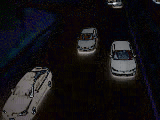

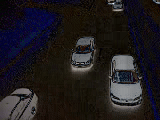

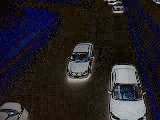

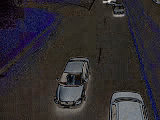

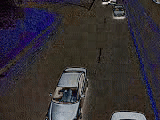

...

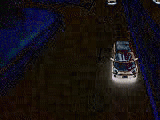

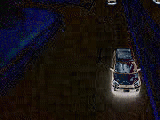

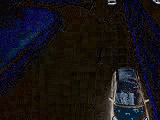

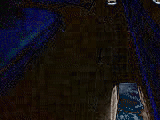

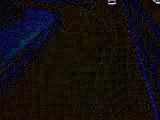

In [17]:
# Initialize an empty list to store the foreground frames
foreground_frames = []

# Iterate over each test frame
for test_frame in test_frames:
    # Subtract the background image from the test frame to get the foreground
    foreground_frame = np.abs(test_frame - background_image)
    foreground_frames.append(foreground_frame)

# Display the foreground frames as a video
display_frames(foreground_frames)

# Save the foreground frames as a video
save_frames(foreground_frames, output_path='./results', file_name='foreground_video')


#### Frame Averaging

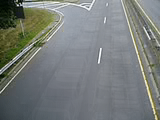

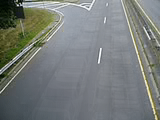

In [18]:
# Calculate the average frame
background_image = np.mean(train_frames, axis=0)

# Display and save the background image
display_frames([background_image])
save_frames([background_image], fps=10.0, output_path='./', file_name='background_image_average')


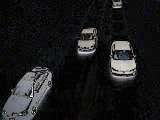

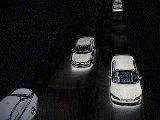

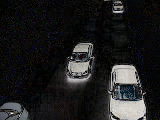

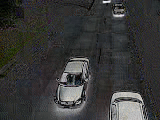

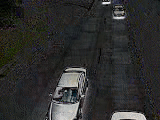

...

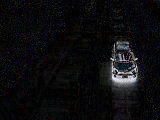

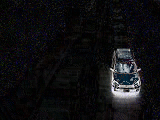

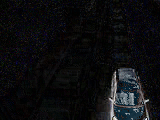

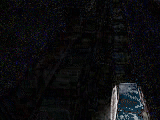

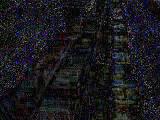

In [19]:
# Calculate the average frame
background_image = np.mean(train_frames, axis=0)

# Initialize an empty list to store the foreground frames
foreground_frames = []

# Iterate over each test frame
for test_frame in test_frames:
    # Subtract the background image from the test frame to get the foreground
    foreground_frame = np.abs(test_frame - background_image)
    foreground_frames.append(foreground_frame)

# Display the foreground frames as a video
display_frames(foreground_frames)

# Save the foreground frames as a video
save_frames(foreground_frames, output_path='./results', file_name='foreground_video_frame_averaging')


#### GMMs per pixel

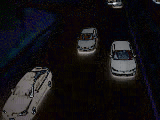

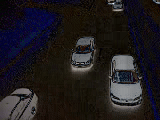

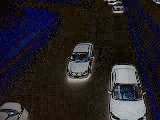

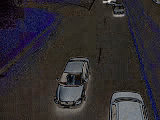

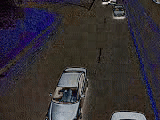

...

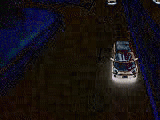

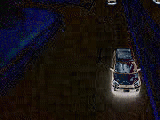

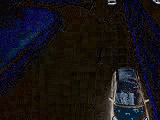

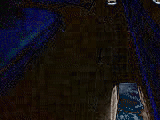

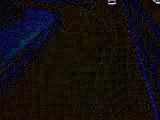

In [20]:
# Initialize an empty list to store the foreground frames
foreground_frames_gmm = []

# Iterate over each test frame
for test_frame in test_frames:
    # Initialize an empty array to store the foreground frame
    foreground_frame_gmm = np.zeros_like(test_frame)

    # Iterate over each pixel
    for i in range(test_frame.shape[0]):
        for j in range(test_frame.shape[1]):
            # Get the GMM model for the current pixel
            gmm = gmm_per_pixel[i * test_frame.shape[1] + j]
            # Extract the mean of the Gaussian component with the highest weight for the current pixel
            background_mean = gmm.means[np.argmax(gmm.weights)]
            # Subtract the background value from the test frame pixel value to get the foreground value
            foreground_pixel_value = np.abs(test_frame[i, j, :] - background_mean)
            foreground_frame_gmm[i, j, :] = foreground_pixel_value

    # Append the foreground frame to the list of foreground frames
    foreground_frames_gmm.append(foreground_frame_gmm)

# Display the foreground frames as a video
display_frames(foreground_frames_gmm)

# Save the foreground frames as a video
save_frames(foreground_frames_gmm, output_path='./results', file_name='foreground_video_gmm_per_pixel')


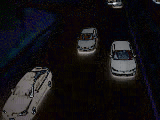

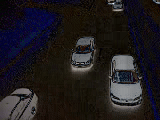

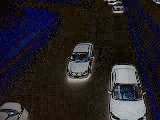

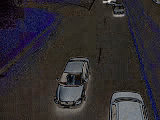

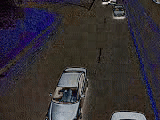

...

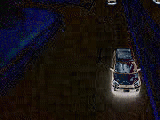

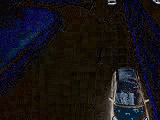

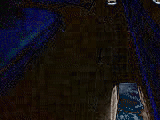

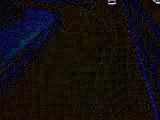

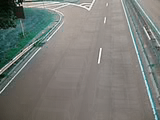

In [21]:
# your output here
import os
from IPython.display import HTML
from base64 import b64encode

def display_video(file_path):
    video_path = open(file_path,'rb').read()
    video_encoded = b64encode(video_path).decode('ascii')
    return HTML(f"""
        <video width="640" height="480" controls>
            <source src="data:video/mp4;base64,{video_encoded}" type="video/mp4">
        Your browser does not support the video tag.
        </video>
    """)

# Ensure the directory exists
output_directory = './results'
os.makedirs(output_directory, exist_ok=True)

# Save frames with predicted labels as video
output_file_path = os.path.join(output_directory, 'predicted_labels_video.mp4')
save_frames(foreground_frames_gmm, fps=10.0, output_path=output_directory, file_name='predicted_labels_video.mp4')

cv2_imshow((background_image * 255).astype(np.uint8))
# Display the video
# display_video(output_file_path)